# Generative Adversarial Network (GAN)
#### Adalberto Valsecchi, corso di Machine Learning e Applicazioni, Dipartimento di Fisica - Università degli Studi di Milano, A.A. 2020/21

## Introduzione

La statistica, e con essa il Machine Learning, si pone come uno degli obiettivi principali quello di approssimare una distribuzione di probabilità (che non conosciamo) a partire dai campionamenti che abbiamo estratto da questa. **In teoria**, una volta "ricostruita" la distribuzione di probabilità dei dati è un'operazione molto semplice estrarre da questa dei nuovi campioni.

**A livello pratico**, però, le distribuzioni di probabilità utilizzate nelle applicazioni di tutti i giorni sono molto complesse e i dati appartengono a spazi caratterizzati da una dimensionalità alta; risulta quindi complicato approssimare precisamente queste PDF, soprattutto perchè gli spazi sono spesso sotto campionati (v. curse of dimensionality).

I **modelli generativi** si presentano come soluzione a questo tipo di problema e hanno come obiettivo quello di generare nuovi sample che emulino il meglio possibile i campioni appartenenti a un dataset.

E' in questo panorama che sono state introdotte delle reti neurali molto interessanti, che hanno attirato l'attenzione di ricercatori e non (https://thispersondoesnotexist.com/): le Generative Adversarial Network (o **GAN**).

Il nome di queste reti è abbastanza esplicativo del loro funzionamento: una GAN è composta da due NN *avversarie*, un discriminatore e un generatore, che continuano a migliorarsi l'una con l'altra, fino a che non vengono *generati* dei nuovi campioni "statisticamente corrispondenti" ai dati di training. Il generatore impara a generare dei nuovi campioni (ad es. delle immagini) così simili agli originali che il discriminatore non riesce a distinguerli; da parte sua il discriminatore imparerà sempre più accuratamente a riconoscere i campioni veri da quelli falsi, creati dal generatore. In pratica, il risultato finale dovrebbe essere:
$$p_\text{gen}\left(\underline{x}\right)\rightarrow p_\text{data}\left(\underline{x}\right)$$

## Il dataset

Come dataset useremo MNIST, uno dei più usati per le applicazioni basilari/elementari di machine learning, che consiste in una raccolta di 70000 cifre scritte a mano, con le rispettive label. Ognuna di queste immagini è composta da un insieme di 28x28 pixel in bianco e nero.

In [1]:
# importiamo tensorflow & co.
import tensorflow as tf
from tensorflow.keras import datasets, layers, models
from tensorflow.keras import optimizers
from tensorflow.keras import regularizers
from tensorflow.keras.utils import to_categorical

# altre librerie
import numpy as np
import matplotlib.pyplot as plt
import time
import glob
from PIL import Image
from IPython.display import clear_output
from IPython.display import HTML
import os
%matplotlib inline

print("Numero GPUs: ", len(tf.config.experimental.list_physical_devices('GPU')))

# creiamo le cartelle che useremo (se non esistono già)
if not os.path.exists('Weights'):
    os.makedirs('Weights')

if not os.path.exists('Images'):
    os.makedirs('Images')

# impostiamo il seme del generatore di numeri random
np.random.seed(19)

# impostiamo la grandezza delle figure e dei font
plt.rcParams['figure.figsize'] = (6,6)
plt.rcParams.update({'font.size': 16})

# scarichiamo il dataset MNIST
(x_train, _), (x_test, _) = tf.keras.datasets.mnist.load_data()

# Vogliamo che gli input abbiano valori tra 0 e 1
x_train, x_test = x_train[..., np.newaxis]/255.0, x_test[..., np.newaxis]/255.0

print('Train', x_train.shape)
print('Test', x_test.shape)

Numero GPUs:  1
Train (60000, 28, 28, 1)
Test (10000, 28, 28, 1)


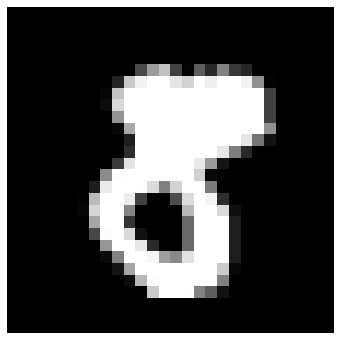

In [2]:
# plottiamo un dato d'esempio
plt.imshow(x_train[np.random.randint(low=0, high=x_train.shape[0])].squeeze(), cmap='gray')
plt.axis('off')
plt.show()

In [3]:
# ********** Alcune funzioni sui dati **********

def genera_seed_generatore(n):
    seeds = tf.random.normal([n, input_gen])
    return seeds

def genera_fake(n_samples, gen):
    # genero seed per il generatore
    seeds = genera_seed_generatore(n_samples)
    
    # i dati prodotti dal generatore sono
    x_fake = gen.predict(seeds)
    return x_fake

# generiamo un batch di immagini vere
def genera_batch(batch_size):
    indices = np.random.randint(low=0, high=x_train.shape[0], size=batch_size)
    return x_train[indices]

# plottiamo un insieme di immagini prodotte dal generatore
def plotta_immagini_gen(gen, test_input, epoch):

    immagini = gen(test_input, training=False)
    dim = immagini.shape[0]

    fig = plt.figure()    
    for i in range(dim):
        plt.subplot(int(np.sqrt(dim)), int(np.sqrt(dim)), i+1)
        plt.imshow(immagini[i, :, :, 0] * 127.5 + 127.5, cmap='gray')
        plt.axis('off')

    if(epoch!=-1): # -1 è un valore speciale che significa "dopo il training"
        fig.suptitle('New digits, epoch {:d}'.format(epoch), fontsize=18)
        plt.savefig('./Images/numbers_epoch_{:04d}.png'.format(epoch))
    else:
        fig.suptitle('New digits after training', fontsize=18)
        plt.savefig('./Images/numbers_after_training.png')
    plt.show()

## La rete

Visto che il nostro dataset è formato da immagini, useremo delle reti neurali convoluzionali e la rete risultante sarà una DCGAN (Deep Convolutional GAN).

Diverse simulazioni, supportate dai consigli presenti in \[2\], mi hanno portato ad impostare il generatore e il discriminatore nel modo presentato nella cella seguente. La GAN non è altro che l'unione di queste due.

L'ottimizzatore più utilizzato nel machine learning è **ADAM**, che ha il grande pregio di aggiornare il learning rate (LR) per ogni passo di training in base al gradiente locale, invece che avere, come in SGD, una step size fissata (che può presentare vari problemi). 

La scelta dei parametri iniziali di ADAM è stata fatta provando diversi valori e osservando i risultati che la rete produceva; con questo metodo abbiamo deciso di tenere i valori che consentivano di avere una convergenza più rapida e precisa.

Per ottenere una stima più precisa e sistematica si sarebbe potuto implementare un grid search, variando i parametri iniziali e addestrando la rete con questi valori. Questo avrebbe però richiesto molto tempo di esecuzione.

In [4]:
# ********** DEFINIZIONE RETI **********

def generator(input_gen):
    model = models.Sequential()
    model.add(layers.Dense(units=7*7*128, input_dim=input_gen))
    model.add(layers.BatchNormalization())
    model.add(layers.Reshape(target_shape=(7,7,128)))
    
    model.add(layers.Conv2DTranspose(filters=128, kernel_size=(2,2), strides=(2,2)))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU(alpha=0.2))

    
    model.add(layers.Conv2DTranspose(filters=64, kernel_size=(2,2), strides=(2,2)))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU(alpha=0.2))

    model.add(layers.Conv2D(1, kernel_size=(7,7), activation='sigmoid', padding='same'))
    
    return model


def discriminator(input_shape, eta=0.0002, beta=0.5):
    model = models.Sequential()
    model.add(layers.Conv2D(filters=32, kernel_size=(3, 3), input_shape=input_shape, padding='same'))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.3))

    model.add(layers.Conv2D(filters=64, kernel_size=(3, 3), strides=(2,2), padding='same', activation='relu'))
    model.add(layers.Dropout(0.3))
    
    model.add(layers.Flatten()) 
    model.add(layers.Dense(50, activation='relu'))
    model.add(layers.Dense(1, activation='sigmoid'))
    
    opt = optimizers.Adam(lr=eta, beta_1=beta)
    model.compile(loss='binary_crossentropy', optimizer=opt)
    
    return model


def GAN(disc, gen, eta=0.0001, beta=0.5):    
    model = models.Sequential()
    model.add(gen)
    model.add(disc)
    
    opt = optimizers.Adam(lr=eta, beta_1=beta)
    model.compile(loss='binary_crossentropy', optimizer=opt)
    return model

## Training della rete

Vediamo un po' di definizione matematica del sistema. Il discriminatore è una funzione 

$$D:\mathbb{R}^P\rightarrow[0,1]$$

che esprime la probabilità che il campionamento $\underline{x}$ venga dal dataset ($p_\text{data}$) invece che dal generatore ($p_\text{gen}$). Invece il generatore è una funzione 

$$G:\mathbb{R}^d\rightarrow\mathbb{R}^P$$

che prende dei punti da uno spazio latente e genera dei campioni di $p_\text{gen}$ in $\mathbb{R}^P$.

Si può dimostrare che il discriminatore ha un punto di ottimo globale:

$$D^∗(\underline{x}) = \frac{p_\text{data}(\underline{x})}{p_\text{data}(\underline{x}) + p_\text{gen}(\underline{x})}$$

Questo significa che, una volta raggiunto il livello ideale di addestramento, $p_\text{gen}(\underline{x})=p_\text{data}(\underline{x})$, il discriminatore non saprà distinguere i dati reali da quelli generati, $D^*(\underline{x})=1/2$.

In cosa consiste, matematicamente, l'addestramento della rete? Che funzione dobbiamo ottimizzare? $D$ deve massimizzare la probabilità di assegnare le label corrette ai campioni (quelli veri e quelli generati da $G$), mentre $G$ deve minimizzare questa stessa probabilità (cioè deve ingannare $D$ il meglio possibile), ovvero:

$$\min_G\max_D\left\{\mathbb{E}_{x∼p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z∼p_z}\left[\log(1 − D(G(z)))\right]\right\}$$

L'algoritmo di training della GAN che abbiamo implementato è quello che viene presentato da \[1\]: addestriamo il discriminatore (per $K$ mini-batch) su $m$ campioni originali e su $m$ campioni generati da $G$ (in modo che impari a distinguere i due tipi di campioni) e poi addestriamo il generatore (per 1 mini-batch) su $m$ campioni $\mathbf{z}\in\mathbb{R}^d$ (in modo che inganni il discriminatore e le immagini generate vengano classificate come vere).

Per essere più precisi, abbiamo implementato una versione leggermente modificata (vedi \[3\]) in cui addestriamo $D$ per $K$ step, poi addestriamo $G$ e ricarichiamo i pesi di $D$ che si avevano dopo il primo dei $K$ step. La rete, quando applichiamo questa variazione, si chiama **unrolled GAN**. Questa modifica è *utile* perché potrebbe succedere che la rete incorra nel **mode collapse**, ovvero il caso in cui il generatore riesce ad ingannare il discriminatore, ma andando a generare una sola classe (una sola cifra); questa ovviamente non è una situazione ideale: noi vogliamo che il generatore produca tutte le classi!

E perché questa è una soluzione? Perché stiamo mettendo il generatore "in difficoltà", dando un vantaggio al discriminatore, che ha più possibilità di addestrarsi; in questo modo $G$ dovrà essere più efficiente nell'imitare la PDF originale dei dati.

**N.B.**: le simulazioni ci hanno comunque dimostrato che prendere $K=1$ dà comunque risultati soddisfacenti, a patto che il discriminatore sia sufficientemente complesso e fare questa scelta ci consente di risparmiare tempo di esecuzione.

*Osservazione*: in questa implementazione della funzione di training non abbiamo considerato dei dati di validazione, che sarebbero molto importanti. Il loro utilizzo però (dovendo usare la funzione `fit()` al posto che `train_on_batch()`) rallenta di un fattore 3 l'esecuzione della rete e quindi, visto che "ad occhio" la rete riesce comunque a generare dei nuovi campioni soddisfacenti, abbiamo deciso di non utilizzare un set di validazione.

In [5]:
# ********** TRAINING RETE **********

def train(gen, disc, gan, epochs, batch_size, K):   
    startissimo = time.time()    
    # semi su cui applico il generatore ad ogni epoca (per vedere le performance)
    seeds_test = genera_seed_generatore(36)
    
    # dobbiamo salvare "a mano" la loss function epoca per epoca
    hist_disc = np.zeros(epochs)
    hist_gan = np.zeros(epochs)
    
    hist_disc_test = np.zeros(epochs)
    hist_gan_test = np.zeros(epochs)
    
    # target che useremo nel training
    y_ones = np.ones(batch_size)
    y_zeros = np.zeros(batch_size)
    targets = tf.concat([y_ones, y_zeros], axis=0)
    
    n_batch = int(x_train.shape[0]/batch_size)
    
    # bisogna implementare le epoche e i batch "a mano", perchè dobbiamo addestrare due reti contemporaneamente
    for i in range(epochs):
        clear_output(wait=True)
        start = time.time()
                
        print("\n---------- Epoca %d/%d ----------" %(i+1, epochs))
        print("Tempo dall'inizio =", round(time.time()-startissimo, 2),"s")

        for i_batch in range(n_batch):
            print("Batch %d/%d" %(i_batch+1,n_batch), end="\r")
            
            disc.trainable = True
            # Unrolled GAN (v. [3])
            for k in range(K):
                # genera immagini col generatore
                x_fake = genera_fake(batch_size, gen)
                batch = genera_batch(batch_size)
                
                batch = tf.concat([batch, x_fake], axis=0)

                # training discriminatore
                if (k==0):
                    hist = disc.train_on_batch(batch, targets)
                    hist_disc[i] += hist/n_batch
                    disc.save_weights('./Weights/disc_weights_k=0.h5')
                else:
                    disc.train_on_batch(batch, targets)
            
            # semi per addestrare il generatore
            x_seeds = genera_seed_generatore(batch_size)
            
            # training GAN (AKA training generatore)            
            disc.trainable = False # per addestrare il generatore devo usare la GAN,
                                   # senza però cambiare i pesi del discriminatore
            hist = gan.train_on_batch(x_seeds, y_ones)
            hist_gan[i] += hist/n_batch
            
            disc.load_weights('./Weights/disc_weights_k=0.h5')
            
        plotta_immagini_gen(gen, seeds_test, i+1)
        
        hist_disc_test[i], hist_gan_test[i] = test(batch_size)
           
        print("Tempo epoca = ", time.time() - start)
       
        # salviamo i pesi delle reti
        if((i+1) % 10 == 0):
            gan.save_weights('./Weights/gan_weights_epoch_{:03d}.h5'.format(i+1))
            gen.save_weights('./Weights/gen_weights_epoch_{:03d}.h5'.format(i+1))
            disc.save_weights('./Weights/disc_weights_epoch_{:03d}.h5'.format(i+1))
        
        plt.pause(2)
        
    return hist_disc, hist_gan, hist_disc_test, hist_gan_test

def test(batch_size):
    x_fake = genera_fake(10000, gen)
    x_disc = np.concatenate((x_test, x_fake))
    
    y_ones = np.ones(10000)
    y_zeros = np.zeros(10000)
    targets = np.concatenate((y_ones, y_zeros))

    x_seeds = genera_seed_generatore(10000)
    
    print("----- Test -----")
    print("Discriminatore: ")
    loss_disc = disc.evaluate(x_disc, targets, batch_size)
    print("GAN: ")
    loss_gan = gan.evaluate(x_seeds, y_ones)
    
    return loss_disc, loss_gan

## Esecuzione rete neurale

In [6]:
# inizializziamo la rete

# parametri che ci servono
input_gen = 100
input_shape = x_train.shape[1:4] # (28, 28, 1)

gen = generator(input_gen)
disc = discriminator(input_shape)
gan = GAN(disc, gen)


---------- Epoca 200/200 ----------
Tempo dall'inizio = 26246.7 s


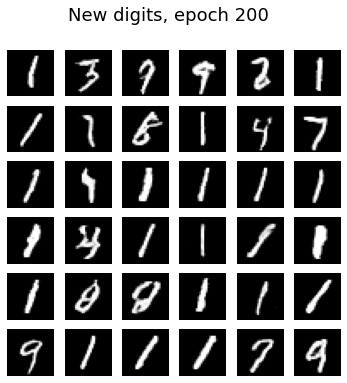

----- Test -----
Discriminatore: 
100/100 [==============================] - 2s 18ms/step - loss: 0.2027
GAN: 
313/313 [==============================] - 5s 17ms/step - loss: 2.5736
Tempo epoca =  142.3295454978943


In [7]:
# addestriamo la rete
epochs = 200
batch_size = 200

hist_disc, hist_gan, hist_disc_test, hist_gan_test = train(gen, disc, gan, epochs, batch_size, K=1)

## Riassunto training

Per mostrare un riassunto della procedura di training consideriamo l'evoluzione nel corso delle epoche delle immagini prodotte dal generatore partendo da un set fissato di 36 punti nello spazio latente (li abbiamo chiamati "semi" per il generatore). Nelle celle qui sotto creiamo e mostriamo una GIF di queste immagini.

E' interessante osservare che dopo un centinaio di epoche si inizia ad osservare il mode collapse: il generatore inizia a produrre molti più campioni del numero 1; ci conviene quindi recuperare i pesi della rete prima che avvenga questo fenomeno.

Successivamente mostriamo i plot della funzione di costo in funzione delle epoche per il discriminatore e per la GAN intera.

In [8]:
# Creiamo GIF con le immagini prodotte durante il training
path_in = "./Images/numbers_epoch_*.png"
path_out = "./Images/numbers.gif"

img, *imgs = [Image.open(f) for f in sorted(glob.glob(path_in))]
img.save(fp=path_out, format='GIF', append_images=imgs,
         save_all=True, duration=150, loop=0)


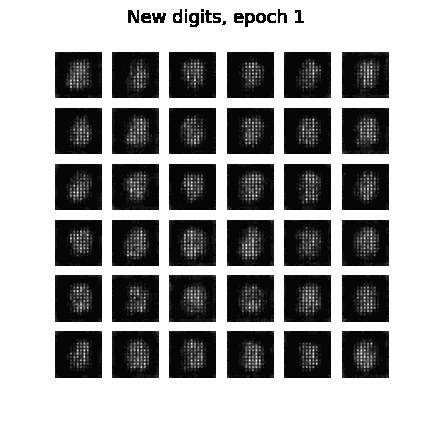

In [9]:
# Mostriamo la GIF creata
import tensorflow_docs.vis.embed as embed
embed.embed_file(path_out)

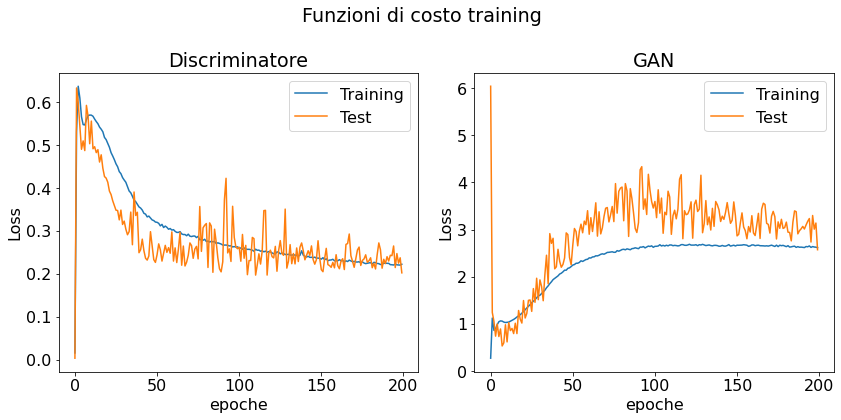

In [10]:
fig = plt.figure(figsize=(12,6))
fig.suptitle('Funzioni di costo training')

# plot loss discriminatore
plt.subplot(1,2,1)
plt.title('Discriminatore')
plt.xlabel('epoche')
plt.ylabel('Loss')
plt.plot(hist_disc, label='Training')
plt.plot(hist_disc_test, label='Test')
plt.legend()

# plot loss GAN
plt.subplot(1,2,2)
plt.title('GAN')
plt.xlabel('epoche')
plt.ylabel('Loss')
plt.plot(hist_gan, label='Training')
plt.plot(hist_gan_test, label='Test')
plt.legend()

plt.tight_layout()
plt.show()

Queste celle ci portano a capire (soprattutto grazie al colpo d'occhio) che la situazione migliore viene raggiunta attorno alla centesima epoca e quindi ricarichiamo le reti che sono state prodotte in quel punto.

In [11]:
disc.load_weights('./Weights/disc_weights_epoch_100.h5')
gan.load_weights('./Weights/gan_weights_epoch_100.h5')
gen.load_weights('./Weights/gen_weights_epoch_100.h5')

## Test performance Generatore

La valutazione delle performance del generatore è complicata da fare in modo quantitativo: come si fa a valutare che un campione complicato come un'immagine appartenga effettivamente alla stessa distribuzione di probabilità del dataset iniziale?

Infatti, molto spesso ci si accontenta di una stima "a occhio"; le immagini qui sotto sono dei nuovi campioni prodotti dal nostro generatore e sono piuttosto soddisfacenti: sembrano effettivamente delle cifre scritte a mano da una persona.

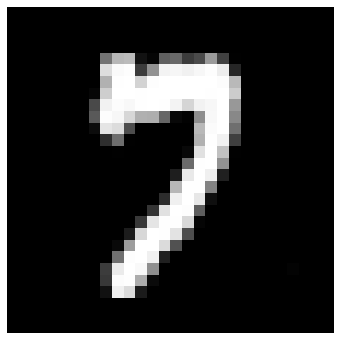

In [12]:
# generiamo un'immagine col generatore
noise = genera_seed_generatore(1)
generated_image = gen(noise, training=False)

# disegnamo l'immagine generata
plt.imshow(generated_image[0, :, :, 0], cmap='gray')
plt.axis('off')
plt.show()

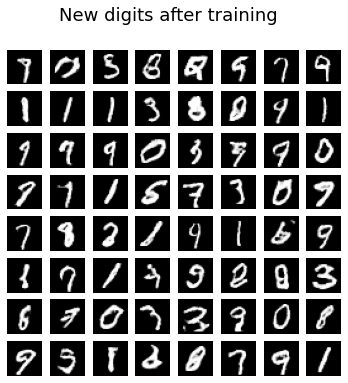

In [13]:
# genero 64 nuove immagini generate dal generatore addestrato
noise = genera_seed_generatore(64)
plotta_immagini_gen(gen, noise, -1)

Per rendere il discorso un poco più quantitativo, addestriamo un'altra rete (sempre convoluzionale) che classifichi le immagini nelle 10 cifre oppure come rumore bianco e vediamo come sono distribuiti i campioni prodotti dal generatore. 

La situazione ideale è quella in cui il nuovo classificatore divide i nuovi dati in modo uniforme nelle varie classi: questo significherebbe che abbiamo, almeno parzialmente, ricostruito la PDF dei dati di training. Qui sotto possiamo vedere che questa situazione viene raggiunta in modo abbastanza soddisfacente.

In [14]:
def digits_classifier(input_shape, eta, lmbd):
    model = models.Sequential()
    model.add(layers.Conv2D(filters=11, kernel_size=(3,3), input_shape=input_shape, padding='same', activation='relu', kernel_regularizer=regularizers.l2(lmbd)))
    model.add(layers.MaxPooling2D(pool_size=(2, 2)))
    model.add(layers.Flatten())
    
    model.add(layers.Dense(50, activation='relu', kernel_regularizer=regularizers.l2(lmbd)))
    model.add(layers.Dense(11, activation='softmax', kernel_regularizer=regularizers.l2(lmbd)))
    
    sgd = optimizers.SGD(lr=eta)
    model.compile(loss='categorical_crossentropy', optimizer=sgd)
    
    return model

# ricarichiamo il dataset MNIST
(x_train, y_train), (_, _) = tf.keras.datasets.mnist.load_data()

# Vogliamo che gli input abbiano valori tra 0 e 1
x_train = x_train[..., np.newaxis]/255.0

# aggiungo una nuova classe, rumore bianco
gen1 = generator(input_gen) # nuovo generatore, non addestrato
x_noise = genera_fake(10000, gen1)
y_noise = np.ones(10000) * 10

x_train = np.concatenate((x_train, x_noise))
Y_train = np.concatenate((y_train, y_noise))

Y_train = to_categorical(Y_train)

eta=1e-2
lmbd=1e-2

epochs = 100
batch_size = 100

DC = digits_classifier(input_shape, eta, lmbd)
DC.fit(x_train, Y_train, epochs=epochs, batch_size=batch_size, verbose=2)

Epoch 1/100
700/700 - 3s - loss: 1.8950
Epoch 2/100
700/700 - 2s - loss: 1.2088
Epoch 3/100
700/700 - 3s - loss: 1.0096
Epoch 4/100
700/700 - 3s - loss: 0.8663
Epoch 5/100
700/700 - 2s - loss: 0.7600
Epoch 6/100
700/700 - 3s - loss: 0.6805
Epoch 7/100
700/700 - 2s - loss: 0.6213
Epoch 8/100
700/700 - 2s - loss: 0.5769
Epoch 9/100
700/700 - 2s - loss: 0.5429
Epoch 10/100
700/700 - 2s - loss: 0.5169
Epoch 11/100
700/700 - 2s - loss: 0.4974
Epoch 12/100
700/700 - 2s - loss: 0.4823
Epoch 13/100
700/700 - 2s - loss: 0.4710
Epoch 14/100
700/700 - 2s - loss: 0.4619
Epoch 15/100
700/700 - 2s - loss: 0.4552
Epoch 16/100
700/700 - 2s - loss: 0.4496
Epoch 17/100
700/700 - 3s - loss: 0.4454
Epoch 18/100
700/700 - 2s - loss: 0.4419
Epoch 19/100
700/700 - 2s - loss: 0.4392
Epoch 20/100
700/700 - 2s - loss: 0.4371
Epoch 21/100
700/700 - 3s - loss: 0.4354
Epoch 22/100
700/700 - 3s - loss: 0.4336
Epoch 23/100
700/700 - 3s - loss: 0.4327
Epoch 24/100
700/700 - 3s - loss: 0.4316
Epoch 25/100
700/700 - 3s

In [15]:
x_fake = genera_fake(20000, gen)
predizioni = DC.predict(x_fake)

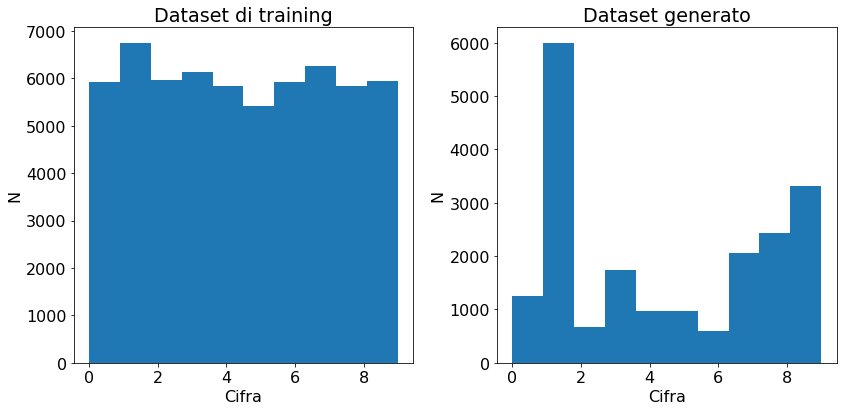

In [16]:
predictions = list(map(np.argmax, predizioni))

fig = plt.figure(figsize=(12,6))
plt.subplot(1,2,1)
plt.hist(y_train)
plt.title('Dataset di training')
plt.xlabel('Cifra')
plt.ylabel('N')

plt.subplot(1,2,2)
plt.hist(predictions)
plt.title('Dataset generato')
plt.xlabel('Cifra')
plt.ylabel('N')

plt.tight_layout()
plt.show()

La pdf generata non è uniforme come quella dei dati di training e mostra dei picchi su alcune cifre. Quello più significativo si ha in corrispondenza dell'1; questo non ci deve però stupire, infatti è facile convincersi del fatto che questa cifra sia la più facile da generare (è una semplice linea!) e quindi che il generatore sia "tentato" di generarla più spesso.

Delle possibili soluzioni che si possono implementare sono:
1. diminuire il numero di dati con la label "1" nel dataset di training;
2. utilizzare la strategia delle unrolled GAN, ovvero usare la funzione di training con $K>1$ (andando a pagare un costo in termini di tempo).

## Conclusioni e prospettive

### Cosa ho imparato
Questo progetto è stato molto utile per diverse ragioni, soprattutto perché mi ha permesso di familiarizzare con molti argomenti importanti nel machine learning, ad esempio:
- l'utilizzo delle convolutional neural network, che sono uno strumento fondamentale per affrontare tutti i problemi legati ai dataset formati da immagini;
- la classificazione dei dati;
- la differenza tra **supervised e unsupervised learning**; il problema che proponiamo alla GAN (cioè "creare delle *nuove* cifre) è tipicamente un problema di unsupervised learning, ma è inserito in un contesto in cui viene trattato come un problema di supervised learning;
- le GAN sono delle reti neurali "complicate", formate dall'unione di due reti che devono aggiornarsi di pari passo, e questo mi ha obbligato a implementare personalmente la funzione di training per il modello; ho quindi avuto la possibilità di comprendere meglio come utilizzare TensorFlow e come funzionano in generale le reti neurali;
- ho utilizzato uno dei dataset più utilizzati e importanti nel machine learning, MNIST.

### Prospettive
L'argomento delle GAN è vastissimo e in continua espansione e questo progetto è stato solo una visita superficiale di questo ambito. Qui sotto elenco (senza pretese di completezza) alcune possibili estensioni del codice e delle applicazioni di questi modelli:
- implementare la ricerca dei parametri iniziali dell'ottimizzatore tramite **grid search**;
- implementare l'utilizzo di un **set di validazione**;
- **conditional GAN**: variante delle GAN in cui chiedo al generatore di produrre un nuovo campione che appartenga ad una particolare classe (ad es, "generatore, producimi un 7");
- per velocizzare le prestazioni della rete potrei applicarla sempre su **MNIST**, ma dopo avergli applicato una riduzione dimensionale, tramite la **PCA**;
- potrei implementare delle GAN con **altri datasets, anche non di immagini**, in modo da familiarizzare con altri tipi di NN e non solo quelle convoluzionali;
- potrei indagare meglio le **unrolled GAN** e capire quanto la modifica alla funzione di training migliori la precisione della rete.

## Bibliografia

\[1\]: I. Goodfellow et al., <a href="https://arxiv.org/abs/1406.2661">Generative Adversarial Networks</a>, 2014

\[2\]: Y. Wang, <a href="https://arxiv.org/abs/2009.00169">A Mathematical Introduction to Generative Adversarial Nets (GAN)</a>, 2020


\[3\]: L. Metz, <a href="https://arxiv.org/abs/1611.02163">Unrolled Generative Adversarial Networks</a>, 2017